In [1]:
import os
import json
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm

import utils.utils as utils


In [2]:
json_file_path = "data/annotations.json"

with open(json_file_path, "r") as json_file:
    coco_data = json.load(json_file)

annotations = coco_data["annotations"]
images = coco_data["images"]


In [3]:
# Calculate the class distribution
class_counts = {}
for img in tqdm(images):
    class_id = img["file_name"].split('_')[-1].split('.')[0]
    class_counts[class_id] = class_counts.get(class_id, 0) + 1

# Filter out images with classes that have only one instance
images = [img for img in images if class_counts[img["file_name"].split('_')[-1].split('.')[0]] > 1]


unique_classes = [c for c, v in class_counts.items() if v == 2]

# Randomly select the desired number of classes
num_classes = 20
selected_classes = random.sample(unique_classes, num_classes)
#selected_classes = images

# Filter the images based on the selected classes
images = [img for img in images if img["file_name"].split('_')[-1].split('.')[0] in selected_classes]

# Get the set of filtered image IDs
image_ids = {img["id"] for img in images}

# Filter the annotations based on the filtered image IDs
annotations = [ann for ann in annotations if ann["image_id"] in image_ids]

#print(f"Selected classes: {selected_classes}")
print("Number of filtered images:", len(images))

"""
# Get the set of filtered image IDs
image_ids = {img["id"] for img in images}

# Filter out annotations that belong to filtered images
annotations = [ann for ann in annotations if ann["image_id"] in image_ids]

print("Number of images:", len(images))
"""

  0%|          | 0/1193 [00:00<?, ?it/s]

Number of filtered images: 40


'\n# Get the set of filtered image IDs\nimage_ids = {img["id"] for img in images}\n\n# Filter out annotations that belong to filtered images\nannotations = [ann for ann in annotations if ann["image_id"] in image_ids]\n\nprint("Number of images:", len(images))\n'

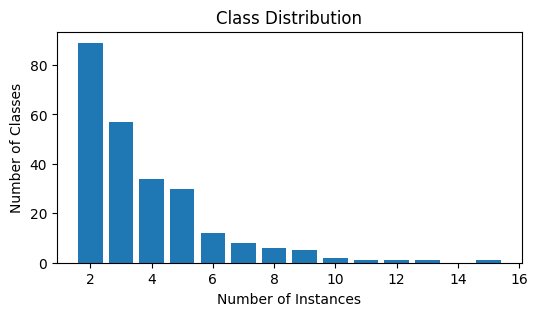

In [5]:
from collections import Counter


def plot_class_distribution(images):
    # Calculate the class distribution
    class_counts = {}
    for img in images:
        class_id = img["file_name"].split('_')[-1].split('.')[0]
        class_counts[class_id] = class_counts.get(class_id, 0) + 1

    
    instance_counts = Counter(class_counts.values())
    instances = sorted(instance_counts.keys())
    frequencies = [instance_counts[inst] for inst in instances]
    # Sort the classes by their counts
    #sorted_classes = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)

    # Separate class IDs and their counts
    #classes, counts = zip(*sorted_classes)

    # Create a bar chart for the class distribution
    plt.figure(figsize=(6, 3))
    plt.bar(instances, frequencies)
    plt.xlabel("Number of Instances")
    plt.ylabel("Number of Classes")
    plt.title("Class Distribution")
    plt.show()


plot_class_distribution(images)

In [4]:
def apply_mask_and_crop(image, mask, bbox):
    # Apply the mask
    masked_image = cv2.bitwise_and(image, image, mask=mask)

    # Crop the image using the bounding box
    x, y, w, h = [int(coordinate) for coordinate in bbox]
    cropped_image = masked_image[y:y+h, x:x+w]

    return cropped_image


In [7]:
def apply_grayscale_and_filter(img):
    img = np.array(img)
    result = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    result = cv2.medianBlur(result, 1)
    #_, result = cv2.threshold(result, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    #result = cv2.adaptiveThreshold(result, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 101, 1)
    result = cv2.adaptiveThreshold(result, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 13, 5)
    #result = Image.fromarray(result, mode="L")
    return result

In [6]:
image_folder = "data/images"
segmented_images = {}

for img_info in tqdm(images):
    # Load the image
    img_path = os.path.join(image_folder, img_info["file_name"])
    original_img = cv2.imread(img_path)
    height, width, _ = original_img.shape

    # Find the corresponding annotation
    for ann in annotations:
        if ann["image_id"] == img_info["id"]:
            
            bbox = ann["bbox"]
            segment = np.asarray(ann["segmentation"][0])
            segment = np.reshape(segment, (int(segment.shape[-1] / 2), 2))
            
            # Resize image, segmentation, and bounding box
            resize_width, resize_height = 600, None
            img = utils.image_resize(original_img, width=resize_width, height=resize_height)
            segment = utils.contour_resize(segment, original_img, img)
            bbox = utils.bbox_resize(bbox, original_img, img)
            
            # Create a mask from the segmentation data
            mask = np.zeros(img.shape[:2], dtype=np.uint8)
            
            segment = np.array(segment, dtype=np.int32).reshape((-1, 2))
            cv2.fillPoly(mask, [segment], 255)

            # Apply the mask and crop the image
            
            segmented_image = apply_mask_and_crop(img, mask, bbox)
            #segmented_image = apply_grayscale_and_filter(segmented_image)
            segmented_images[img_info["file_name"]] = segmented_image

            # Stop searching for annotations once we found the correct one
            break


  0%|          | 0/40 [00:00<?, ?it/s]

In [7]:
def display_random_samples(images, num_samples=5):
    random_keys = random.sample(list(images.keys()), num_samples)
    fig, axes = plt.subplots(1, num_samples, figsize=(15, 15))
    
    for i, key in enumerate(random_keys):
        axes[i].imshow(segmented_images[key])
        axes[i].set_title(key)
        axes[i].axis('off')
    
    plt.show()

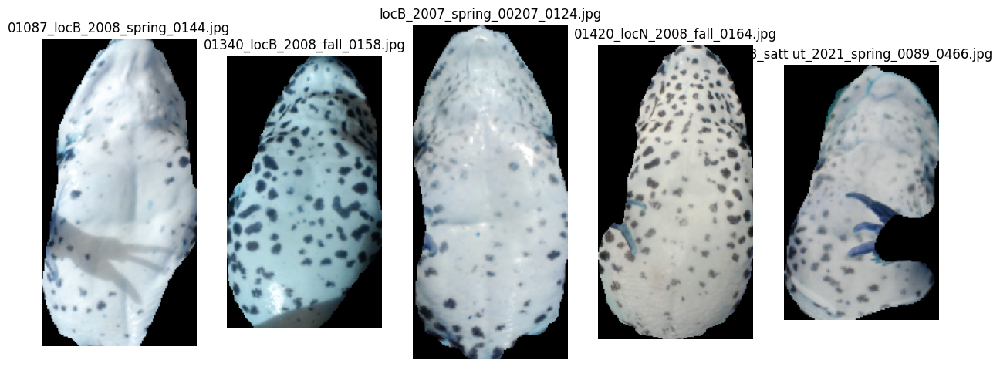

In [8]:
display_random_samples(segmented_images)

In [9]:
sift_detector = cv2.SIFT_create()
orb_detector = cv2.ORB_create()

bf_matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)


In [10]:
# SIFT FLANN matcher
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
sift_flann_matcher = cv2.FlannBasedMatcher(index_params, search_params)

In [30]:
# ORB FLANN matcher
FLANN_INDEX_LSH = 6
index_params= dict(algorithm = FLANN_INDEX_LSH,
                   table_number = 6, # 12
                   key_size = 12,     # 20
                   multi_probe_level = 1) #2
search_params = dict(checks=50)   # or pass empty dictionary
orb_flann_matcher = cv2.FlannBasedMatcher(index_params, search_params)


In [53]:
def precompute_keypoints_and_descriptors(images_dict, detector):
    keypoints_and_descriptors = {}

    for img_name, img in tqdm(images_dict.items()):
        #img = apply_grayscale_and_filter(img)
        keypoints, descriptors = detector.detectAndCompute(img, None)
        if descriptors is not None:
            descriptors = descriptors.astype(np.float32)
        #keypoints = [kp for kp in keypoints if kp.size >= 10]
        keypoints_and_descriptors[img_name] = (keypoints, descriptors)

    return keypoints_and_descriptors

sift_keypoints_and_descriptors = precompute_keypoints_and_descriptors(segmented_images, sift_detector)
orb_keypoints_and_descriptors = precompute_keypoints_and_descriptors(segmented_images, orb_detector)


  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

In [39]:
import pickle

def convert_keypoints_to_pickle(keypoints):
    return [(kp.pt, kp.size, kp.angle, kp.response, kp.octave, kp.class_id) for kp in keypoints]

def save_data(filename, data):
    converted_data = {}
    for img_name, (keypoints, descriptors) in data.items():
        if descriptors is not None:
            descriptors = descriptors.tolist() # descriptors to list
        converted_data[img_name] = (convert_keypoints_to_pickle(keypoints), descriptors)
    
    with open(filename, 'wb') as f:
        pickle.dump(converted_data, f)

save_data('descriptors/13-5-thresholded_sift_keypoints_and_descriptors.pkl', sift_keypoints_and_descriptors)
save_data('descriptors/13-5-thresholded_orb_keypoints_and_descriptors.pkl', orb_keypoints_and_descriptors)


In [ ]:
def convert_pickle_to_keypoints(pickled_keypoints):
    return [cv2.KeyPoint(x=x, y=y, _size=size, _angle=angle, _response=response, _octave=octave, _class_id=class_id) for (x, y), size, angle, response, octave, class_id in pickled_keypoints]

def load_data(filename):
    with open(filename, 'rb') as f:
        data = pickle.load(f)
    converted_data = {}
    for img_name, (pickled_keypoints, descriptors) in data.items():
        if descriptors is not None:
            descriptors = np.array(descriptors, dtype=np.float32) # back to numpy array
        converted_data[img_name] = (convert_pickle_to_keypoints(pickled_keypoints), descriptors)
    return converted_data

sift_keypoints_and_descriptors = load_data('sift_keypoints_and_descriptors.pkl')
orb_keypoints_and_descriptors = load_data('orb_keypoints_and_descriptors.pkl')


In [17]:
# Ratio testing, for SIFT
def compute_matches(query_img_name, query_descriptors, keypoints_and_descriptors_dict, matcher, ratio_threshold=0.7):
    match_ratios = {}

    for img_name, (keypoints, descriptors) in tqdm(keypoints_and_descriptors_dict.items(), leave=False):
        if img_name != query_img_name and descriptors is not None and len(descriptors) >= 2:
            # Perform the ratio test
            good_matches = []
            for m, n in matcher.knnMatch(query_descriptors, descriptors, k=2):
                if m.distance < ratio_threshold * n.distance:
                    good_matches.append(m)
            match_ratios[img_name] = (len(good_matches), good_matches)

    # Get the image with the highest number of good matches
    predicted_img_name, (count, good_matches) = max(match_ratios.items(), key=lambda x: x[1][0])
    predicted_class = predicted_img_name.split('_')[-1].split('.')[0]
    return predicted_img_name, predicted_class, good_matches


In [54]:
# Match number based, for BF
def compute_matches(query_img_name, query_descriptors, keypoints_and_descriptors_dict, matcher):
    match_counts = {}

    for img_name, (keypoints, descriptors) in tqdm(keypoints_and_descriptors_dict.items(), leave=False):
        if img_name != query_img_name and descriptors is not None:
            matches = matcher.match(query_descriptors, descriptors)
            match_counts[img_name] = (len(matches), matches)

    # Get the image with the highest number of matches
    predicted_img_name, (count, matches) = max(match_counts.items(), key=lambda x: x[1][0])
    predicted_class = predicted_img_name.split('_')[-1].split('.')[0]
    return predicted_img_name, predicted_class, matches


In [20]:
# Distance based
def compute_matches(query_img_name, query_descriptors, keypoints_and_descriptors_dict, matcher, distance_threshold=50):
    match_distances = {}

    for img_name, (keypoints, descriptors) in tqdm(keypoints_and_descriptors_dict.items(), leave=False):
        if img_name != query_img_name and descriptors is not None:
            matches = matcher.match(query_descriptors, descriptors)
            matches.sort(key=lambda x: x.distance)
            #good_matches = [m for m in matches if m.distance < distance_threshold]
            matches[:min(len(matches), 5)]
            if matches:
                average_distance = sum([x.distance for x in matches]) / len(matches)
            else:
                average_distance = float("inf")
            match_distances[img_name] = (average_distance, matches)

    # Get the image with the lowest sum of good match distances
    #predicted_img_name, (total_distance, good_matches) = min(match_distances.items(), key=lambda x: x[1][0])
    
    # Get the image with the lowest average distance
    predicted_img_name, (average_distance, good_matches) = min(match_distances.items(), key=lambda x: x[0][0])
    
    predicted_class = predicted_img_name.split('_')[-1].split('.')[0]
    return predicted_img_name, predicted_class, good_matches

In [55]:
#detectors = [("SIFT", sift_keypoints_and_descriptors, sift_flann_matcher), ("ORB", orb_keypoints_and_descriptors, orb_flann_matcher)]
#detectors = [("ORB", orb_keypoints_and_descriptors, orb_flann_matcher)]
#detectors = [("SIFT", sift_keypoints_and_descriptors, sift_flann_matcher)]
#detectors = [("SIFT_BF", sift_keypoints_and_descriptors, bf_matcher)]
detectors = [("SIFT_BF", sift_keypoints_and_descriptors, bf_matcher), ("ORB_BF", orb_keypoints_and_descriptors, bf_matcher)]
results = {}

for detector_name, keypoints_and_descriptors, matcher in tqdm(detectors):
    results[detector_name] = []

    #for query_img_name in tqdm(segmented_images.keys()):
     #   query_descriptors = keypoints_and_descriptors[query_img_name][1]
      #  predicted_img_name, predicted_class, good_matches = compute_matches(query_img_name, query_descriptors, keypoints_and_descriptors, bf_matcher)
       # results[detector_name].append((query_img_name, predicted_img_name, predicted_class, good_matches))
    for query_img_name in tqdm(segmented_images.keys()):
        query_descriptors = keypoints_and_descriptors[query_img_name][1]
        predicted_img_name, predicted_class, good_matches = compute_matches(query_img_name, query_descriptors, keypoints_and_descriptors, matcher)
        results[detector_name].append((query_img_name, predicted_img_name, predicted_class, good_matches))




  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

In [65]:
import random

# Get a list of all unique classes in the dataset
classes = list(set(img_name.split('_')[-1].split('.')[0] for img_name in segmented_images.keys()))

results["Random"] = []
# Make random predictions
for query_img_name in tqdm(segmented_images.keys()):
    query_descriptors = keypoints_and_descriptors[query_img_name][1]

    # Select a class at random
    predicted_class = random.choice(classes)

    # Use the random class to find a random image of that class
    predicted_img_name = random.choice([img_name for img_name in segmented_images.keys() if img_name.split('_')[-1].split('.')[0] == predicted_class])

    # Since we're not actually matching keypoints, there are no "good matches"
    good_matches = []

    results["Random"].append((query_img_name, predicted_img_name, predicted_class, good_matches))


  0%|          | 0/927 [00:00<?, ?it/s]

In [63]:
results.keys()

dict_keys(['SIFT_BF', 'ORB_BF', 'Random'])

In [58]:
import pickle

def convert_matches_to_dict(matches):
    matches_dict = [{'queryIdx': m.queryIdx, 'trainIdx': m.trainIdx, 'imgIdx': m.imgIdx, 'distance': m.distance} for m in matches]
    return matches_dict

def convert_dict_to_matches(matches_dict):
    matches = [cv2.DMatch(m['queryIdx'], m['trainIdx'], m['imgIdx'], m['distance']) for m in matches_dict]
    return matches


stored_results = [(query_img_name, predicted_img_name, predicted_class, convert_matches_to_dict(good_matches))
                  for (query_img_name, predicted_img_name, predicted_class, good_matches) in results["SIFT_BF"]]

with open('results/13-5-thresholded_sift_bf.pkl', 'wb') as f:
    pickle.dump(stored_results, f)

In [59]:
import numpy as np

def evaluate_results(results, segmented_images_dict):
    evaluation = {}

    for detector_name, predictions in tqdm(results.items()):
        true_positives = 0
        false_positives = 0
        false_negatives = 0

        for query_img_name, _, predicted_class, _ in tqdm(predictions):
            true_class = query_img_name.split('_')[-1].split('.')[0]
            if true_class == predicted_class:
                true_positives += 1
            else:
                false_positives += 1
                false_negatives += 1

        accuracy = true_positives / (true_positives + false_positives + false_negatives) if (true_positives + false_positives + false_negatives) > 0 else np.nan
        precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else np.nan
        recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else np.nan


        evaluation[detector_name] = {
            "accuracy": accuracy,
            "precision": precision,
            "recall": recall
        }

    return evaluation


In [66]:
evaluation = evaluate_results(results, segmented_images)
print(evaluation)


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

{'SIFT_BF': {'accuracy': 0.08484493856056173, 'precision': 0.15641855447680691, 'recall': 0.15641855447680691}, 'ORB_BF': {'accuracy': 0.003789929615592853, 'precision': 0.007551240560949299, 'recall': 0.007551240560949299}, 'Random': {'accuracy': 0.0016207455429497568, 'precision': 0.003236245954692557, 'recall': 0.003236245954692557}}


In [67]:
def visualize_matches(query_img_name, predicted_img_name, good_matches, keypoints_and_descriptors_dict, images_dict):
    query_img = images_dict[query_img_name]
    predicted_img = images_dict[predicted_img_name]

    query_keypoints = keypoints_and_descriptors_dict[query_img_name][0]
    predicted_keypoints = keypoints_and_descriptors_dict[predicted_img_name][0]

    # Draw the matches
    img_matches = cv2.drawMatches(query_img, query_keypoints, predicted_img, predicted_keypoints, good_matches, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.figure(figsize=(16, 8))
    plt.imshow(img_matches)
    plt.title(f"Query Image: {query_img_name}, Predicted Image: {predicted_img_name}")
    plt.show()


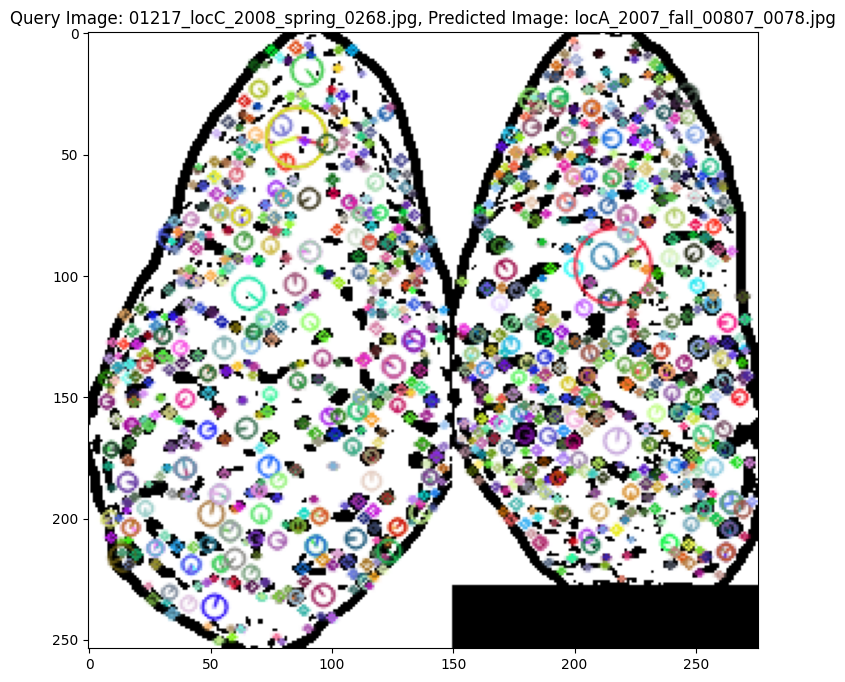

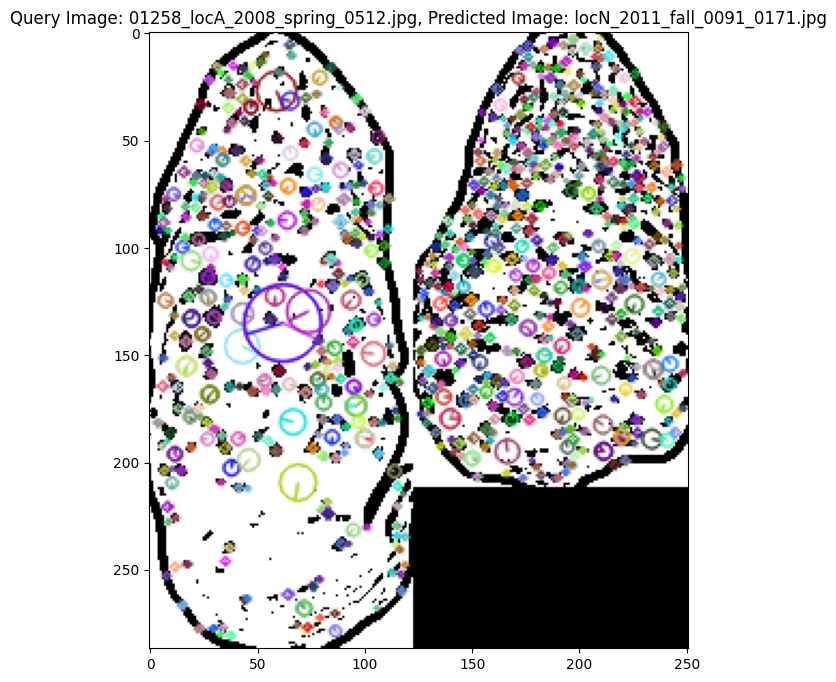

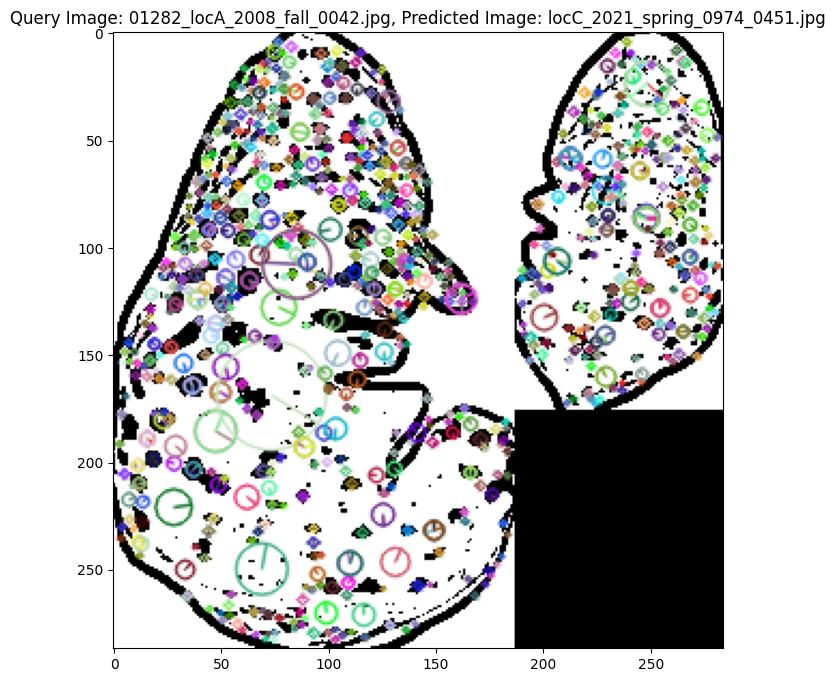

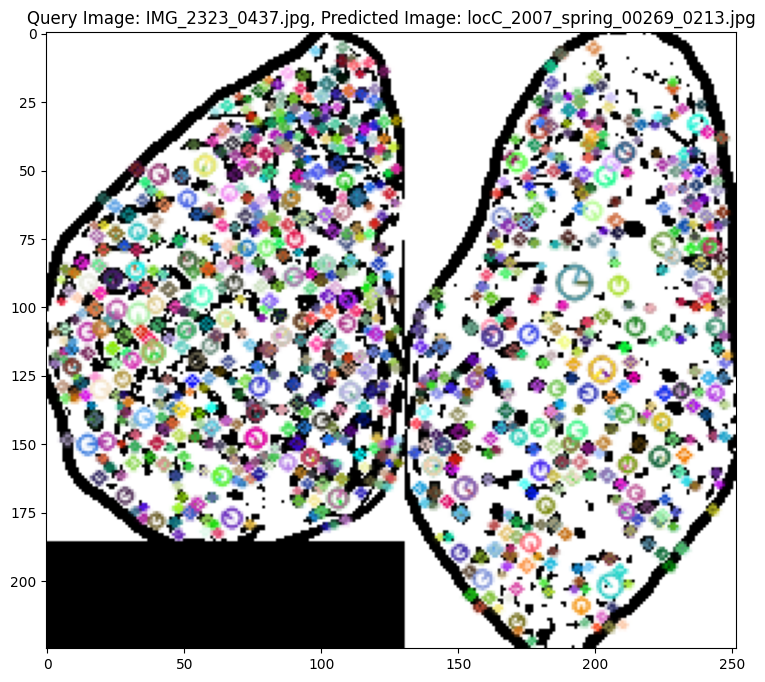

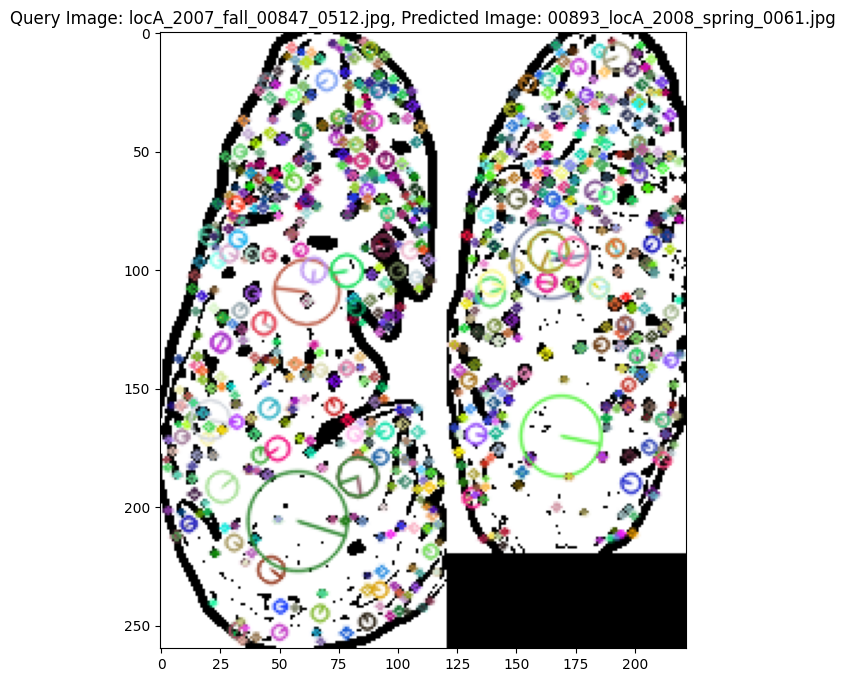

...

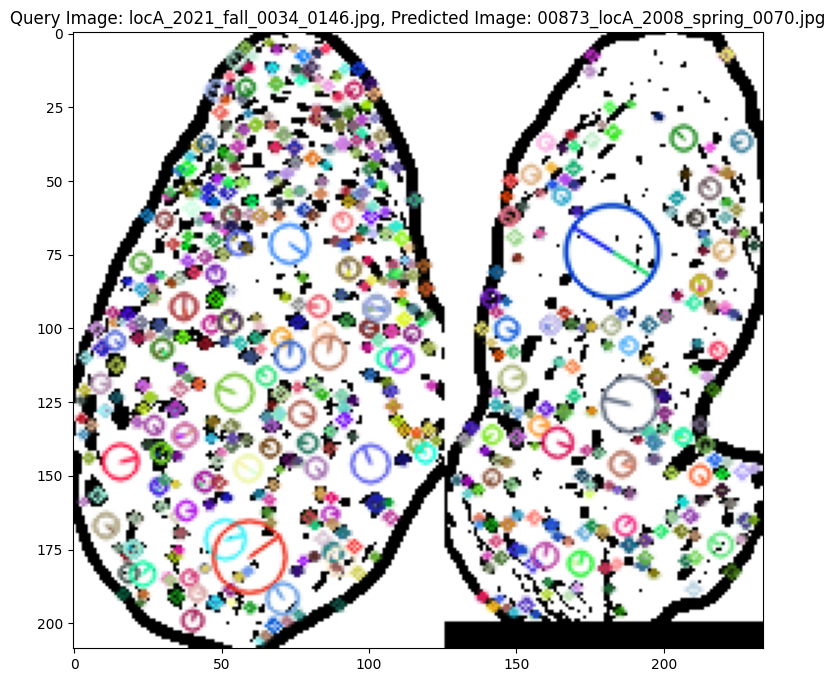

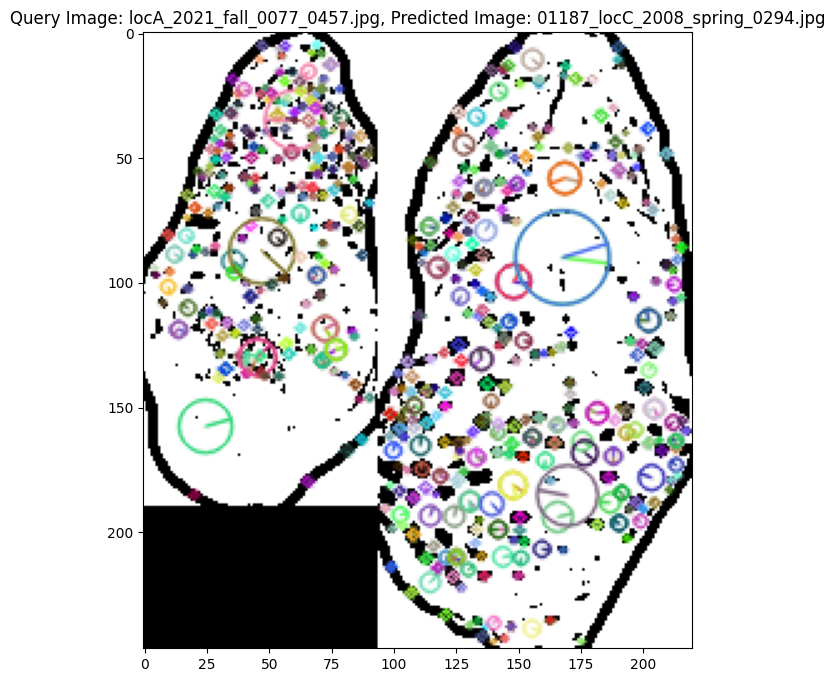

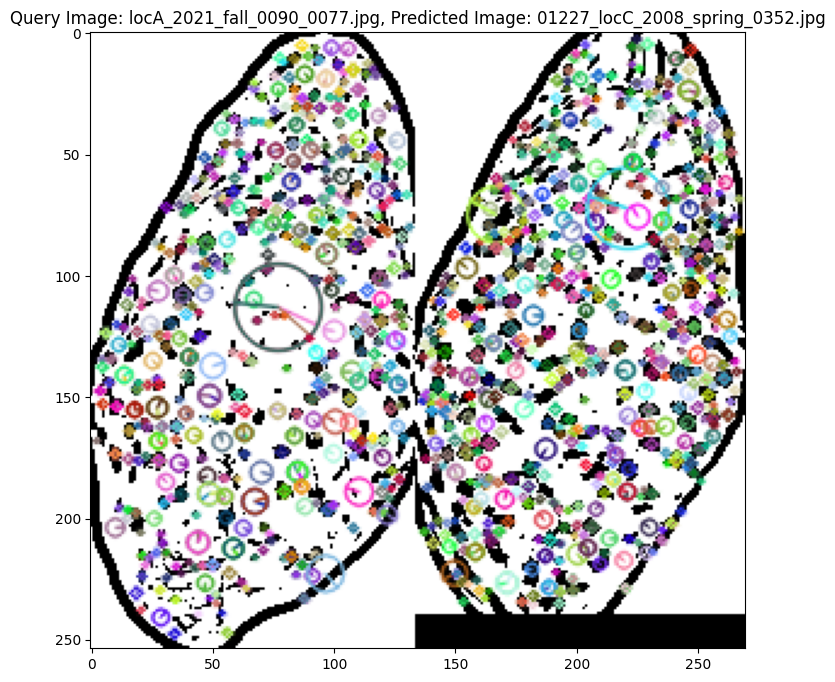

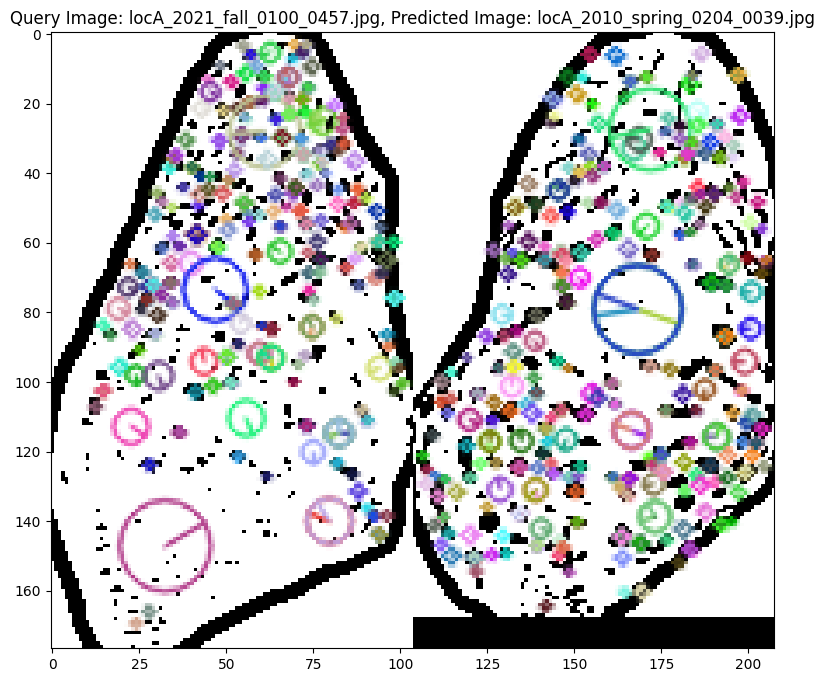

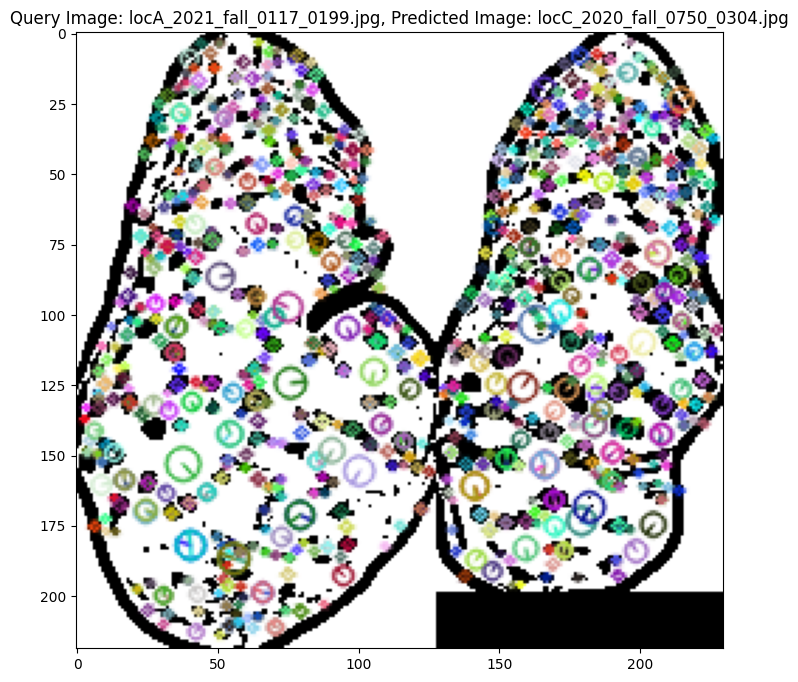

In [69]:
num_visualizations = 20

for i, (query_img_name, predicted_img_name, predicted_class, good_matches) in enumerate(results['Random'][:num_visualizations]):
    visualize_matches(query_img_name, predicted_img_name, good_matches, sift_keypoints_and_descriptors, segmented_images)


# Parameter testing

In [46]:
class MSEMatcher():

    def __init__(self):
        pass

    def detectAndCompute(self, image, *args, **kwargs):
        return None, image

    def match(self, image1, image2):
        mse = ((image1 - image2)**2).mean(axis=None)
        return mse

class Matcher:

    def __init__(self, matcher):
        self.lowe_ratio = 0.7

        if matcher == "orb":
            self._detector = cv2.ORB_create()
            self._matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
            self._matcher_fn = self._match_orb
            self._draw_fn = self._draw_orb

        elif matcher == "sift":
            self._detector = cv2.SIFT_create()
            #self._matcher = cv2.BFMatcher()
            self._matcher = cv2.FlannBasedMatcher(dict(algorithm=FLANN_INDEX_KDTREE, trees=5), dict(checks=50))
            self._matcher_fn = self._match_sift
            self._draw_fn = self._draw_sift
        elif matcher == "mse":
            self._detector = MSEMatcher()
            self._matcher = self._detector
            self._matcher_fn = self._match_mse
            self._draw_fn = self._draw_mse



    def detect(self, image1, image2):
        # finding key points and descriptors of both images using detectAndCompute() function
        key_point1, descrip1 = self._detector.detectAndCompute(image1, None)
        key_point2, descrip2 = self._detector.detectAndCompute(image2, None)

        #try:
        list_of_matches, mean_distance = self._matcher_fn(descrip1, descrip2)
        #except Exception as e:
            #list_of_matches, mean_distance = [], 90000000

        return len(list_of_matches), list_of_matches, mean_distance, key_point1, key_point2
    
    def detect_from_descriptors(self, des1, des2):
        #try:
        list_of_matches, mean_distance = self._matcher_fn(des1, des2)
        #except Exception as e:
            #list_of_matches, mean_distance = [], 90000000

        return len(list_of_matches), list_of_matches, mean_distance

    def _match_mse(self, des1, des2):
        distance = self._matcher(des1, des2)
        return [], distance

    def _match_sift(self, des1, des2):

        matches = self._matcher.knnMatch(des1, des2, k=2)
        good = []
        for m, n in matches:
            if m.distance < self.lowe_ratio * n.distance:
                good.append(m)

        if good:
            average_distance = sum([x.distance for x in good]) / len(good)
        else:
            average_distance = float("inf")
        return good, average_distance

    def _match_orb(self, des1, des2):
        # Match descriptors.
        #print(f"des1: type={des1.dtype}, shape={des1.shape}")
        #print(f"des2: type={des2.dtype}, shape={des2.shape}")
        matches = self._matcher.match(des1, des2)

        # Sort them in the order of their distance.
        matches = list(sorted(matches, key=lambda x: x.distance))
        #matches = matches[:min(len(matches), 50)]  # Top 5 matches

        # Apply RANSAC filtering
        #matches = self._match_with_ransac(kp1, kp2, matches)

        average_distance = sum([x.distance for x in matches]) / len(matches)

        return matches, average_distance
    
    def _match_with_ransac(self, kp1, kp2, matches, threshold=3):
        # Convert keypoints to points
        src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

        # Find the homography matrix using RANSAC
        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, threshold)

        # Apply the mask to filter out outliers
        matches_mask = mask.ravel().tolist()
        filtered_matches = [m for m, is_inlier in zip(matches, matches_mask) if is_inlier]

        return filtered_matches

    def _draw_sift(self, img1, kp1, img2, kp2, matches):
        return cv2.drawMatchesKnn(img1,kp1,img2,kp2,matches,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    def _draw_orb(self, img1, kp1, img2, kp2, matches):
        return cv2.drawMatches(img1,kp1,img2,kp2,matches,None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    def _draw_mse(self, img1, kp1, img2, kp2, matches):
        return img1 - img2

    def draw_matches(self, img1, kp1, img2, kp2, matches):
        return self._draw_fn(img1, kp1, img2, kp2, matches)

In [12]:
import itertools

def _image_matcher(args):
    matcher_name, i1, i2 = args

    sample1 = roi_ds[i1]
    sample2 = roi_ds[i2]
    s1_name = sample1["filename"]
    s2_name = sample2["filename"]
    s1_frog_id = sample1["frog_id"]
    s2_frog_id = sample2["frog_id"]
    des1 = sample1["descriptors"]
    des2 = sample2["descriptors"]


    #num_matches, matches, mean_distance, kpt1, kpt2 = detector.detect(sample1["roi"], sample2["roi"])
    num_matches, matches, mean_distance = detector.detect_from_descriptors(des1, des2)

    return dict(
        s1_name=s1_name,
        s2_name=s2_name,
        match_count=num_matches,
        s1_id=s1_frog_id,
        s2_id=s2_frog_id,
        mean_distance=mean_distance
    )


def match_images(use_tqdm=True):
        
    #data_comb = list(itertools.combinations(roi_ds, r=2))
    #data_comb = [[args.matcher] + list(x) for x in data_comb]

    #data_comb = list(itertools.combinations(enumerate(descriptors), r=2))
    #data_comb = [[args.matcher, roi_ds[i1], roi_ds[i2], des1, des2] for (i1, des1), (i2, des2) in data_comb]

    combinations = list(itertools.combinations(segmented_images.keys(), r=2))
    combinations = [[matcher_name, i1, i2] for i1, i2 in combinations]

    iterator = (_image_matcher(c) for c in combinations)
    if use_tqdm:
        iterator = tqdm(iterator, desc="Performing matching for all samples.", total=len(combinations), leave=False)
    results: list = list(iterator)
    return results

In [13]:
def transform_results(mp_results, use_tqdm=True):
    results = {}
    iterator = mp_results
    if use_tqdm:
        iterator = tqdm(iterator, desc="Transforming results from multiprocessing to map structure", leave=False)
    for res in iterator:

        if res["s1_name"] not in results:
            results[res["s1_name"]] = []
        if res["s2_name"] not in results:
            results[res["s2_name"]] = []

        results[res["s1_name"]].append((
            (res["s2_id"], res["match_count"], res["s2_name"], res["mean_distance"])
        ))
        results[res["s2_name"]].append((
            (res["s1_id"], res["match_count"], res["s1_name"], res["mean_distance"])
        ))
    return results

In [14]:
def classify(results, use_tqdm=True):
    classified_results = results.copy()
    """
    if args.mean_distance:
        print("Classifying with mean distance")
    else:
        print("Classifying with match count")
    """
    use_mean_distance = False
    iterator = results.keys()
    if use_tqdm:
        iterator = tqdm(iterator,  desc="Classifying", leave=False)
    # Sort matches and "classify" with the one having most matches. Or based on mean distance
    for k in iterator:
        if use_mean_distance:
            chosen_match = sorted(results[k], key=lambda x: x[3], reverse=False)[0]
        else:
            chosen_match = sorted(results[k], key=lambda x: x[1], reverse=True)[0]

        classified_results[k] = chosen_match
    return classified_results

In [15]:
def calc_success_rate(ds, use_tqdm=True):
    
    iterator = ds.items()
    if use_tqdm:
        iterator = tqdm(iterator, desc="Populating confusion matrix", leave=False)
    
    true_positives = 0
    false_positives = 0
    false_negatives = 0
    for filename, prediction in iterator:
        actual_frog_id = filename.split("_")[-1]
        prediction_frog_id = prediction[0]

        if prediction_frog_id == actual_frog_id:
            true_positives += 1
        else:
            false_positives += 1
            false_negatives += 1

    accuracy = true_positives / (true_positives + false_positives + false_negatives)
    precision = true_positives / (true_positives + false_positives)
    recall = true_positives / (true_positives + false_negatives)
    print("Accuracy:", accuracy)

    return accuracy, precision, recall

In [16]:
roi_ds = {}
for k, v in tqdm(segmented_images.items()):
    roi_ds[k] = {
        "filename": k,
        "frog_id": k.split('_')[-1].split('.')[0],
        "base_roi": v
    }

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

RuntimeError: No active exception to reraise

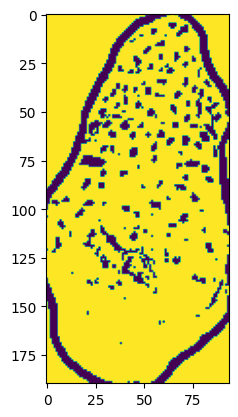

In [48]:
from time import time
import multiprocessing as mp
import seaborn as sns

block_sizes = list(range(3, 103, 2))
c_values = list(range(15))

block_sizes = [13]
c_values = [5]


#MIN_LOG_TIME_INTERVAL = 0.5  # Minimum time interval between log messages (in seconds)
#MAX_LOG_TIME_INTERVAL = 5.0  # Maximum time interval between log messages (in seconds)


def log_progress(process_name, block_size, c_value, last_log_time, log_file):
    elapsed_time = time() - last_log_time
    #log_time_interval = min(MAX_LOG_TIME_INTERVAL, max(MIN_LOG_TIME_INTERVAL, elapsed_time * 10))
    
    #if time() - last_log_time > log_time_interval:
    # Uindented
    last_log_time = time()
    with open(log_file, 'a') as f:
        f.write(f"    Done with {process_name} for block_size {block_size} and c {c_value}. Elapsed time: {elapsed_time:.4f}s\n")
    
    return last_log_time, elapsed_time


matrix = np.zeros((len(block_sizes), len(c_values), 7))
matcher_name = "sift"
log_file = f"testing_{matcher_name}.log"
detector = Matcher(matcher_name)
for i, c in tqdm(enumerate(c_values), total=len(c_values)):
    for j, block_size in tqdm(enumerate(block_sizes), total=len(block_sizes)):
        with open(log_file, 'a') as f:
            f.write(f"Working with block_size {block_size} and c {c}:\n")
        
        last_log_time = time()
        
        start_time = last_log_time
        
        # Preprocessing
        for k, sample  in roi_ds.items():
            roi = cv2.cvtColor(sample["base_roi"], cv2.COLOR_BGRA2GRAY)
            roi = cv2.medianBlur(roi, 1)
            roi = cv2.adaptiveThreshold(roi, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, block_size, c)
            sample["roi"] = roi
            plt.imshow(roi)
            raise
        last_log_time, time_preprocessing = log_progress("Preprocessing", block_size, c, last_log_time, log_file)
               
        # Feature detection
        for k, sample in roi_ds.items():
            roi = sample["roi"]
            kp, des = detector._detector.detectAndCompute(roi, None)
            sample["keypoints"] = kp
            sample["descriptors"] = des
        last_log_time, time_detection = log_progress("Feature detection", block_size, c, last_log_time, log_file)
        
        # Match images
        t = time()
        results = match_images(use_tqdm=False)
        results = transform_results(results, use_tqdm=False)
        last_log_time, time_matching = log_progress("Image matching", block_size, c, last_log_time, log_file)
        
        # Classification
        classified_results = classify(results, use_tqdm=False)
        last_log_time, time_classification = log_progress("Classification", block_size, c, last_log_time, log_file)

        # Success rate
        accuracy, precision, recall = calc_success_rate(classified_results, use_tqdm=False)
        print(accuracy)
        
        time_total = time() - start_time
        matrix[j, i, :] = (accuracy, precision, recall, time_total, time_detection,
                           time_matching, time_classification)
        np.save(f"{matcher_name}_parameter_testing/" + "performance_matrix.npy", matrix)
        

In [17]:
# Plot the performance of the processes
for k, title in enumerate(("Accuracy", "Precision", "Recall", "Total Time", "Feature Detection Time",
                           "Matching Time", "Classification Time")):
    fig = plt.figure(figsize=(20, 20))
    arr = matrix[:, :, k]
    ax = sns.heatmap(arr, annot=True, xticklabels=c_values, yticklabels=block_sizes)

    ax.set_xlabel("C Values")
    ax.set_ylabel("Block Sizes")
    ax.set_title(title)
    plt.savefig(f"{matcher_name}_parameter_testing/" + f"performance_matrix_{title}" + ".png", dpi=300, bbox_inches='tight')
    plt.close(fig)

In [44]:
import numpy as np
matcher_name = "sift"
matrix = np.load(f"{matcher_name}_parameter_testing/" + "performance_matrix.npy")
print(matrix[:, :, 0])

[[0.]]


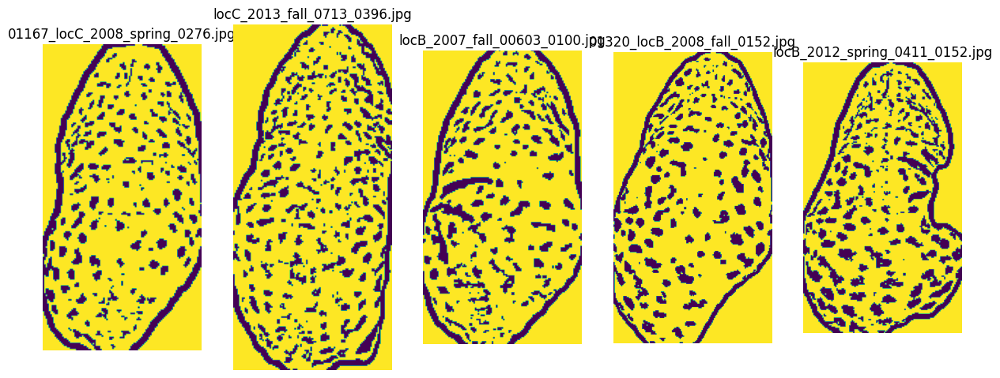

In [57]:
random_keys = random.sample(list(roi_ds.keys()), 5)
fig, axes = plt.subplots(1, 5, figsize=(15, 15))

for i, key in enumerate(random_keys):
    axes[i].imshow(roi_ds[key]["roi"])
    axes[i].set_title(key)
    axes[i].axis('off')

plt.show()